# STAT 301 Group Project Proposal - Predicting Housing Prices of Residential Homes in Ames, Iowa

#### Authors: Emilio Dorador, Amar Gill, Tanmay Thakral, Yolanda Wu

In [ ]:
library(tidyverse)
library(infer)
library(repr)
library(dplyr)
library(GGally)
install.packages("GGally")

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.5 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.3      ✔ forcats 0.5.2 
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



## Introduction

During the sale of a house, it is important to have a realtor as it is likely that they will benefit the seller or buyer rather than having a non-realtor(Huang & Rutherford). As such, a realtor needs to have important information regarding the house as well as any statistical inferences that can aid them in the sale since using the internet and other related information-based technologies can lead to increased earnings(Benjamin et al.). The data used regards housing information gathered from Ames, Iowa in 2010 (Kaggle) and the project aims to predict housing prices and to determine the critical factors that affect a house's price. 

## Exploratory Data Analysis

#### Step 1 - Reading the Dataset

In [ ]:
# Read the data into R
housing_data <- read_csv("https://raw.githubusercontent.com/yolanda-5/Stat301-Project/main/train.csv")
head(housing_data)

Rows: 1460 Columns: 81
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (43): MSZoning, Street, Alley, LotShape, LandContour, Utilities, LotConf...
dbl (38): Id, MSSubClass, LotFrontage, LotArea, OverallQual, OverallCond, Ye...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,⋯,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
1,60,RL,65,8450,Pave,NA,Reg,Lvl,AllPub,⋯,0,NA,NA,NA,0,2,2008,WD,Normal,208500
2,20,RL,80,9600,Pave,NA,Reg,Lvl,AllPub,⋯,0,NA,NA,NA,0,5,2007,WD,Normal,181500
3,60,RL,68,11250,Pave,NA,IR1,Lvl,AllPub,⋯,0,NA,NA,NA,0,9,2008,WD,Normal,223500
4,70,RL,60,9550,Pave,NA,IR1,Lvl,AllPub,⋯,0,NA,NA,NA,0,2,2006,WD,Abnorml,140000
5,60,RL,84,14260,Pave,NA,IR1,Lvl,AllPub,⋯,0,NA,NA,NA,0,12,2008,WD,Normal,250000
6,50,RL,85,14115,Pave,NA,IR1,Lvl,AllPub,⋯,0,NA,MnPrv,Shed,700,10,2009,WD,Normal,143000


#### Step 2 - Cleaning and Wrangling the Data into Tidy Format

In [ ]:
# Check for NA values in the dataset
total_missing_values <- sum(is.na(housing_data))
paste("There are", total_missing_values ,"missing values in the dataset")

[1] "There are 6965 missing values in the dataset"

For now, let's drop the columns that contain NA values.

In [ ]:
housing_data <- housing_data %>%
    select_if(~ !any(is.na(.)))

# Get the dimension of the new dataframe and check for NA values again
dim(housing_data)
total_missing_values <- sum(is.na(housing_data))
paste("There are", total_missing_values ,"missing values in the dataset")

[1] 1460   62

[1] "There are 0 missing values in the dataset"

#### Step 3 - Train and Test Split

In [ ]:
# Creating the train and test split
set.seed(1234)

housing_data$Id <- 1:nrow(housing_data)
housing_train <- sample_n(housing_data, size = nrow(housing_data) * 0.70, replace = FALSE)
housing_test <- anti_join(housing_data, housing_train, by = "Id")

# Viewing the train and test datasets and gitting the size of the dataframes
head(housing_train)
dim(housing_train)
head(housing_test)
dim(housing_test)

Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,⋯,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
<int>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
1308,20,RL,8072,Pave,Reg,Lvl,AllPub,Inside,Gtl,⋯,0,0,0,0,0,5,2009,WD,Normal,138000
1018,120,RL,5814,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,⋯,0,0,0,0,0,8,2009,COD,Abnorml,187500
1125,80,RL,9125,Pave,IR1,Lvl,AllPub,Inside,Gtl,⋯,0,0,0,0,0,7,2007,WD,Normal,163900
1004,90,RL,11500,Pave,IR1,Lvl,AllPub,Corner,Gtl,⋯,0,0,0,0,0,6,2007,WD,Normal,136905
623,20,RL,7064,Pave,Reg,Lvl,AllPub,Inside,Gtl,⋯,0,0,0,0,0,7,2009,WD,Normal,135000
905,20,RL,6173,Pave,IR1,Lvl,AllPub,Inside,Gtl,⋯,0,0,0,0,0,8,2007,WD,Normal,125500


[1] 1021   62

Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,⋯,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
<int>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,⋯,0,0,0,0,0,2,2008,WD,Normal,208500
2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,⋯,0,0,0,0,0,5,2007,WD,Normal,181500
5,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,⋯,0,0,0,0,0,12,2008,WD,Normal,250000
7,20,RL,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,⋯,0,0,0,0,0,8,2007,WD,Normal,307000
8,60,RL,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,⋯,228,0,0,0,350,11,2009,WD,Normal,200000
12,60,RL,11924,Pave,IR1,Lvl,AllPub,Inside,Gtl,⋯,0,0,0,0,0,7,2006,New,Partial,345000


[1] 439  62

#### Step 4 - Visualizations (Training Data Only)

First visualize the distribution of the target (response) variable `SalePrice`.

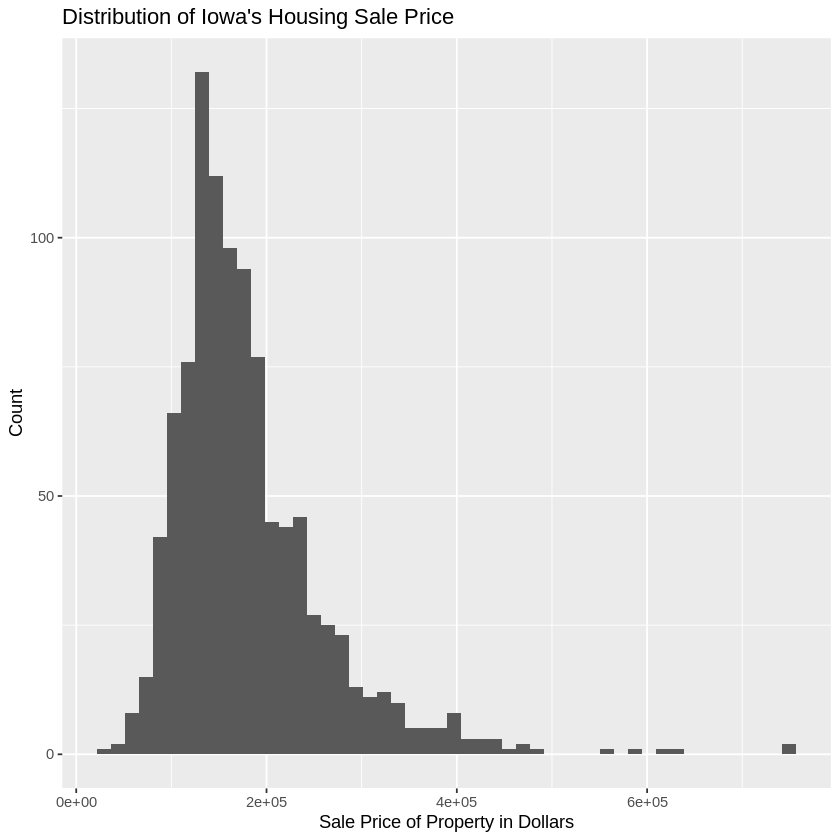

In [ ]:
housing_plot <- housing_train %>% ggplot(aes(x = SalePrice)) +
    geom_histogram(bins = 50) +
    xlab("Sale Price of Property in Dollars") +
    ylab("Count") +
    ggtitle("Distribution of Iowa's Housing Sale Price")
housing_plot

Then plot the response variable against other numeric features to look for any potential appropriate predicting variables.

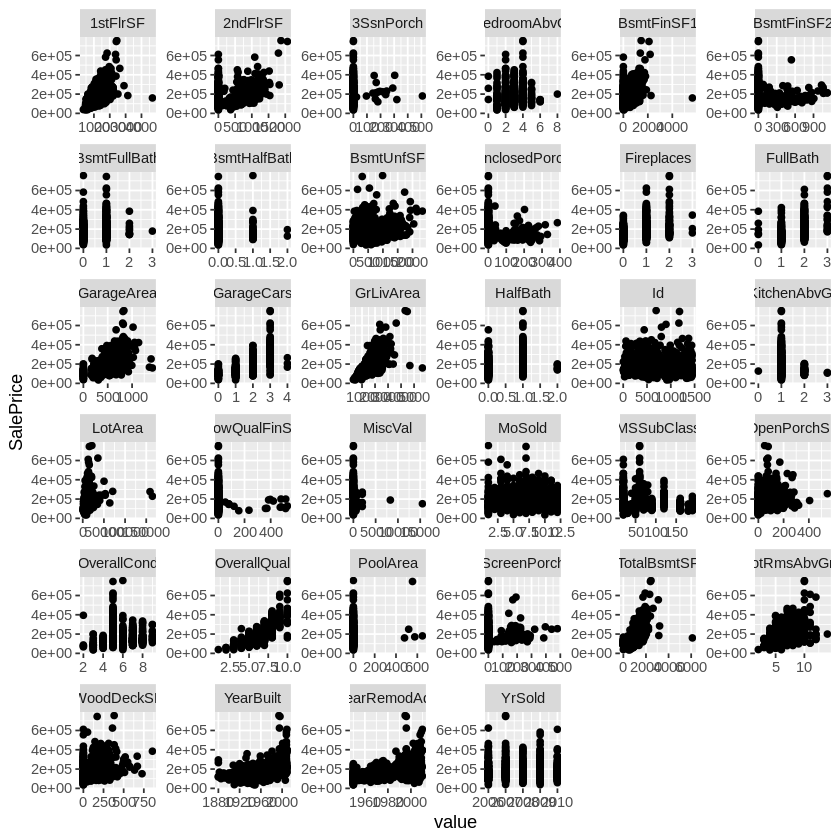

In [ ]:
# Source: https://www.datanovia.com/en/blog/how-to-plot-one-variable-against-multiple-others/

# Collecting all numerical predicting features
housing_gathered <- housing_train %>%
    select_if(is.numeric) %>%
    as_tibble() %>%
    gather(key = "variable", value = "value", -SalePrice)

# Generating plots
ggplot(housing_gathered, aes(x = value, y = SalePrice)) +
    geom_point() +
    facet_wrap(~variable, scales = "free")+
    scale_color_viridis_d()

#### Step 5 - Summary Statistics (Training Data Only)

In [ ]:
# Obtain summary information about the dataset
summary(housing_train)

       Id         MSSubClass       MSZoning            LotArea      
 Min.   :   3   Min.   : 20.00   Length:1021        Min.   :  1477  
 1st Qu.: 380   1st Qu.: 20.00   Class :character   1st Qu.:  7420  
 Median : 727   Median : 50.00   Mode  :character   Median :  9453  
 Mean   : 732   Mean   : 57.27                      Mean   : 10434  
 3rd Qu.:1094   3rd Qu.: 70.00                      3rd Qu.: 11670  
 Max.   :1454   Max.   :190.00                      Max.   :164660  
    Street            LotShape         LandContour         Utilities        
 Length:1021        Length:1021        Length:1021        Length:1021       
 Class :character   Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character  
                                                                            
                                                                            
                                                       

## Methods

### Ways To Secure Trustworthiness:

To begin, the data we use comes from real-world sales in Ames, Iowa, and was collected by the American Statistical Association for use in data sciences. This means that each sale is highly authentic. Second, we are investigating a dataset with a significant amount of data (1460 rows). Third, we'll do feature selection, model selection, and best practices like checking for model assumption violations, the goodness of the model, and so on.

Going forward, we plan to make use of the model selection methods to optimize our selected model subject to training data. We will be working with a split data set (training and testing data) to be able to build a predictive model with the training set and measure the performance of our predictive model with the testing set. We will make use of model fit metrics (such as C(p), BIC, or AIC) for guidance when selecting viable predictive models. 


### Ways To Improve Our Report:

We made a scatterplot of the variables and the sale price to see how they relate, but this isn't enough for us to make predictions. As a result, we intend to train a model that captures the relationship between the variables to accurately predict the sale price.

### What We Hope to Find:

We hope to be able to identify a strong predictive model given the extensive data and number of possible models with varying amounts of predictors. Through this process, we also hope to identify a set of predictors that make part of a strong predictive model of housing prices in Ames, Iowa, along with what role these predictors play in our model.

### Impact of Such Findings:


With our findings, market agents (i.e. buyers, sellers, realtors, etc.) in the Ames housing market will be able to get insight into predictive pricing for their homes, given a selected number of key characteristics (our predictors).

## References

1. Huang, B., & Rutherford, R. (2007). Who you going to call? performance of realtors and non-realtors in a MLS setting. Journal of Real Estate Finance and Economics, 35(1), 77. doi:https://doi.org/10.1007/s11146-007-9029-7

2. Benjamin, J. D., Jud, G. D., Roth, K. A., & Winkler, D. T. (2002). Technology and realtor® income. Journal of Real Estate Finance and Economics, 25(1), 51. Retrieved from https://www.proquest.com/scholarly-journals/technology-realtor®-income/docview/203147731/se-2

3. https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/data